# **Importing the required libraries**

In [1]:
import os
import shutil
import cv2
import math
import random
import numpy as np
import datetime as dt
import tensorflow 
import keras
from collections import deque
import matplotlib.pyplot as plt
plt.style.use("seaborn")

%matplotlib inline
 
from sklearn.model_selection import train_test_split
 
from keras.layers import *
from keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

# **Visualize the Data**

In [2]:
from IPython.display import HTML
from base64 import b64encode

# To Show a Video in Notebook
def Play_Video(filepath):
    html = ''
    video = open(filepath,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=640 muted controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

In [3]:
# Classes Directories
NonViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/"
ViolnceVideos_Dir = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/"

# Retrieve the list of all the video files present in the Class Directory.
NonViolence_files_names_list = os.listdir(NonViolnceVideos_Dir)
Violence_files_names_list = os.listdir(ViolnceVideos_Dir)

# Randomly select a video file from the Classes Directory.
Random_NonViolence_Video = random.choice(NonViolence_files_names_list)
Random_Violence_Video = random.choice(Violence_files_names_list)

**Play Random Non Violence Video**

In [4]:
Play_Video(f"{NonViolnceVideos_Dir}/{Random_NonViolence_Video}")

**Play Random Violence Video**

In [5]:
Play_Video(f"{ViolnceVideos_Dir}/{Random_Violence_Video}")

# **Extracting Frames**

In [6]:
# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
 
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16
 

DATASET_DIR = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/"
 
CLASSES_LIST = ["NonViolence","Violence"]

In [7]:
import cv2
import os
import numpy as np

# Specify the height and width to which each video frame will be resized in our dataset.
IMAGE_HEIGHT , IMAGE_WIDTH = 64, 64
# Specify the number of frames of a video that will be fed to the model as one sequence.
SEQUENCE_LENGTH = 16

# Assuming DATASET_DIR and CLASSES_LIST are defined as in your original code
# DATASET_DIR = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/"
# CLASSES_LIST = ["NonViolence","Violence"]
# Make sure the DATASET_DIR path is correct for your Kaggle environment

# --- Patched frames_extraction function ---
def frames_extraction(video_path):
    frames_list = []
    video_reader = None # Initialize video_reader
    try:
        video_reader = cv2.VideoCapture(video_path)
        if not video_reader.isOpened():
            print(f"Error: Could not open video file: {video_path}")
            return [] # Return empty list if file can't be opened

        video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
        if video_frames_count <= 0:
             print(f"Warning: Video file has no frames or count is invalid: {video_path}")
             video_reader.release()
             return [] # Return empty list if no frames

        skip_frames_window = max(int(video_frames_count / SEQUENCE_LENGTH), 1)

        for frame_counter in range(SEQUENCE_LENGTH):
            video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
            success, frame = video_reader.read()

            if not success:
                # This break is important if read fails before collecting SEQUENCE_LENGTH frames
                print(f"Warning: Failed to read frame at position {frame_counter * skip_frames_window} in video {video_path}. Skipping rest of video.")
                # We might not have enough frames, return empty list to ensure it's skipped later
                frames_list = []
                break

            # --- Add try-except around resize/normalize ---
            # Although the error seems to be in read(), sometimes errors manifest during processing
            try:
                resized_frame = cv2.resize(frame, (IMAGE_WIDTH, IMAGE_HEIGHT)) # Corrected order W, H for cv2.resize
                normalized_frame = resized_frame / 255.0 # Use float division
                frames_list.append(normalized_frame)
            except Exception as e:
                 print(f"Error processing frame {frame_counter * skip_frames_window} from video {video_path}: {e}. Skipping rest of video.")
                 # Return empty list to ensure it's skipped
                 frames_list = []
                 break
            # --- End try-except ---

    except Exception as e:
        # Catch any other unexpected errors during video processing
        print(f"General error processing video {video_path}: {e}")
        frames_list = [] # Ensure empty list on error
    finally:
        # Make sure the video reader is always released
        if video_reader is not None and video_reader.isOpened():
            video_reader.release()

    # Only return the list if it has the required number of frames
    if len(frames_list) == SEQUENCE_LENGTH:
        return frames_list
    else:
        # Return empty list if not enough frames were successfully extracted
        # The calling function `create_dataset` already checks len(frames),
        # but this makes `frames_extraction` more self-contained.
        return []


# **Creating the Data**

In [8]:
# --- Modified create_dataset function (minor change for clarity) ---
def create_dataset():
    features = []
    labels = []
    video_files_paths = []

    print(f"Dataset Directory: {DATASET_DIR}")
    if not os.path.isdir(DATASET_DIR):
        print(f"Error: Dataset directory not found at {DATASET_DIR}")
        return np.array([]), np.array([]), []

    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')
        class_dir = os.path.join(DATASET_DIR, class_name)

        if not os.path.isdir(class_dir):
            print(f"Warning: Class directory not found: {class_dir}")
            continue # Skip to the next class

        files_list = os.listdir(class_dir)
        print(f'Found {len(files_list)} files in {class_name}')

        processed_count = 0
        skipped_count = 0
        for file_name in files_list:
            # Basic check for common video file extensions
            if not file_name.lower().endswith(('.avi', '.mp4', '.mov', '.mkv')): # Add other extensions if needed
                print(f"Skipping non-video file: {file_name}")
                skipped_count += 1
                continue

            video_file_path = os.path.join(class_dir, file_name)

            # Extract the frames of the video file using the patched function
            frames = frames_extraction(video_file_path)

            # Check if the frames_extraction returned the correct number of frames
            # (The patched function returns [] if extraction failed or didn't get enough frames)
            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
                processed_count += 1
            else:
                # No need to print here again, frames_extraction should have printed warnings/errors
                # print(f"Skipping video {video_file_path} due to insufficient frames ({len(frames)}/{SEQUENCE_LENGTH}) or processing error.")
                skipped_count += 1

        print(f'Finished Class: {class_name}. Processed: {processed_count}, Skipped/Error: {skipped_count}')


    # Convert lists to NumPy arrays
    features = np.asarray(features)
    labels = np.array(labels)

    print(f"Dataset creation complete. Features shape: {features.shape}, Labels shape: {labels.shape}")

    return features, labels, video_files_paths

# --- Run the dataset creation ---
# Make sure DATASET_DIR and CLASSES_LIST are correctly defined before this line
# features, labels, video_files_paths = create_dataset()

In [9]:
# Create the dataset.
features, labels, video_files_paths = create_dataset()

Dataset Directory: ../input/real-life-violence-situations-dataset/Real Life Violence Dataset/
Extracting Data of Class: NonViolence
Found 1000 files in NonViolence


[h264 @ 0x5cba0d9edfc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5cba0d9edfc0] error while decoding MB 98 31
[h264 @ 0x5cba0d9edfc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5cba0d9edfc0] error while decoding MB 98 31
[h264 @ 0x5cba0d9edfc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5cba0d9edfc0] error while decoding MB 98 31
[h264 @ 0x5cba0d9edfc0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5cba0d9edfc0] error while decoding MB 98 31


Finished Class: NonViolence. Processed: 1000, Skipped/Error: 0
Extracting Data of Class: Violence
Found 1000 files in Violence
Finished Class: Violence. Processed: 1000, Skipped/Error: 0
Dataset creation complete. Features shape: (2000, 16, 64, 64, 3), Labels shape: (2000,)


In [10]:
# Saving the extracted data
np.save("features.npy",features)
np.save("labels.npy",labels)
np.save("video_files_paths.npy",video_files_paths)

In [11]:
features, labels, video_files_paths = np.load("features.npy") , np.load("labels.npy") ,  np.load("video_files_paths.npy")

# **Encoding and Splitting Training-Testing Sets**

In [12]:
# convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [13]:
# Split the Data into Train ( 90% ) and Test Set ( 10% ).
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.1,
                                                                            shuffle = True, random_state = 42)

In [14]:
print(features_train.shape,labels_train.shape )
print(features_test.shape, labels_test.shape)

(1800, 16, 64, 64, 3) (1800, 2)
(200, 16, 64, 64, 3) (200, 2)


# **Importing MobileNet and Fine-Tuning it.**

In [15]:
from keras.applications.mobilenet_v2 import MobileNetV2

mobilenet = MobileNetV2( include_top=False , weights="imagenet")

#Fine-Tuning to make the last 40 layer trainable
mobilenet.trainable=True

for layer in mobilenet.layers[:-40]:
  layer.trainable=False

#mobilenet.summary()

9420800/9406464 [==============================] - 1s 0us/step


# **Building The Model**

In [16]:
def create_model():
 
    model = Sequential()

    ########################################################################################################################
    
    #Specifying Input to match features shape
    model.add(Input(shape = (SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    
    # Passing mobilenet in the TimeDistributed layer to handle the sequence
    model.add(TimeDistributed(mobilenet))
    
    model.add(Dropout(0.25))
                                    
    model.add(TimeDistributed(Flatten()))

    
    lstm_fw = LSTM(units=32)
    lstm_bw = LSTM(units=32, go_backwards = True)  

    model.add(Bidirectional(lstm_fw, backward_layer = lstm_bw))
    
    model.add(Dropout(0.25))

    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.25))

    model.add(Dense(32,activation='relu'))
    model.add(Dropout(0.25))
    
    
    model.add(Dense(len(CLASSES_LIST), activation = 'softmax'))
 
    ########################################################################################################################
 
    model.summary()
    
    return model

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 16, 2, 2, 1280)    2257984   
_________________________________________________________________
dropout (Dropout)            (None, 16, 2, 2, 1280)    0         
_________________________________________________________________
time_distributed_1 (TimeDist (None, 16, 5120)          0         
_________________________________________________________________
bidirectional (Bidirectional (None, 64)                1319168   
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 256)               16640     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0

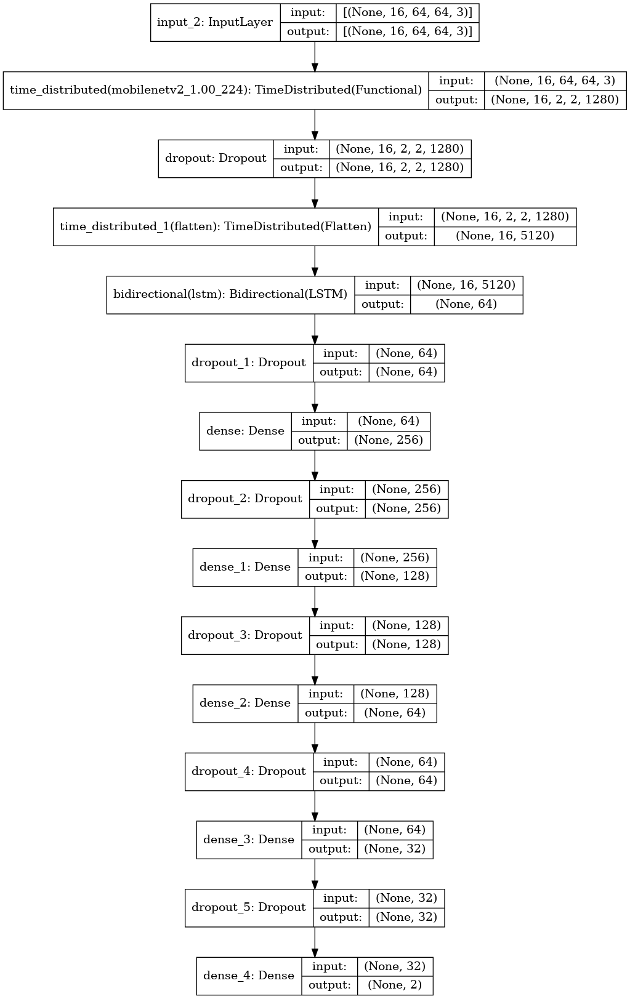

In [17]:
# Constructing the Model
MoBiLSTM_model = create_model()

# Plot the structure of the contructed LRCN model.
plot_model(MoBiLSTM_model, to_file = 'MobBiLSTM_model_structure_plot.png', show_shapes = True, show_layer_names = True)

# **Specifying Callbacks and Fitting**

In [18]:
# Create Early Stopping Callback to monitor the accuracy
early_stopping_callback = EarlyStopping(monitor = 'val_accuracy', patience = 10, restore_best_weights = True)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss',
                                                  factor=0.6,
                                                  patience=5,
                                                  min_lr=0.00005,
                                                  verbose=1)
 
# Compiling the model 
MoBiLSTM_model.compile(loss = 'categorical_crossentropy', optimizer = 'sgd', metrics = ["accuracy"])
 
# Fitting the model 
MobBiLSTM_model_history = MoBiLSTM_model.fit(x = features_train, y = labels_train, epochs = 50, batch_size = 8 ,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback,reduce_lr])

Epoch 1/50
180/180 [==============================] - 97s 496ms/step - loss: 0.7004 - accuracy: 0.4854 - val_loss: 0.6916 - val_accuracy: 0.4722
Epoch 2/50
180/180 [==============================] - 87s 483ms/step - loss: 0.6931 - accuracy: 0.5312 - val_loss: 0.6855 - val_accuracy: 0.5917
Epoch 3/50
180/180 [==============================] - 88s 488ms/step - loss: 0.6760 - accuracy: 0.5903 - val_loss: 0.6530 - val_accuracy: 0.6944
Epoch 4/50
180/180 [==============================] - 95s 526ms/step - loss: 0.6222 - accuracy: 0.6882 - val_loss: 0.5217 - val_accuracy: 0.7528
Epoch 5/50
180/180 [==============================] - 99s 552ms/step - loss: 0.4861 - accuracy: 0.7889 - val_loss: 0.4712 - val_accuracy: 0.7861
Epoch 6/50
180/180 [==============================] - 97s 539ms/step - loss: 0.3846 - accuracy: 0.8507 - val_loss: 0.3269 - val_accuracy: 0.8722
Epoch 7/50
180/180 [==============================] - 97s 539ms/step - loss: 0.2958 - accuracy: 0.8924 - val_loss: 0.2925 - val_ac

In [19]:
model_evaluation_history = MoBiLSTM_model.evaluate(features_test, labels_test)

7/7 [==============================] - 7s 475ms/step - loss: 0.1954 - accuracy: 0.9400


# **Model Evaluation**

In [20]:
def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]
    
    # Get the Epochs Count
    epochs = range(len(metric_value_1))
 
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'orange', label = metric_name_2)
 
    plt.title(str(plot_name))
 
    plt.legend()

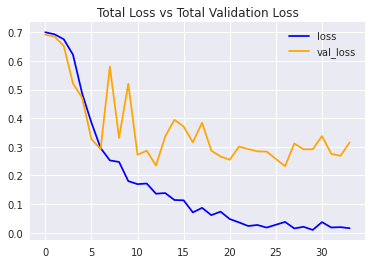

In [21]:
plot_metric(MobBiLSTM_model_history, 'loss', 'val_loss', 'Total Loss vs Total Validation Loss')

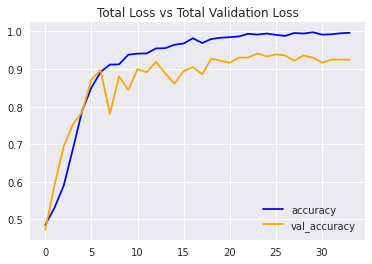

In [22]:
plot_metric(MobBiLSTM_model_history, 'accuracy', 'val_accuracy', 'Total Loss vs Total Validation Loss')

# **Predicting the Test Set**

In [23]:
labels_predict = MoBiLSTM_model.predict(features_test)

In [24]:
# Decoding the data to use in Metrics
labels_predict = np.argmax(labels_predict , axis=1)
labels_test_normal = np.argmax(labels_test , axis=1)

In [25]:
labels_test_normal.shape , labels_predict.shape

((200,), (200,))

Accuracy Score

In [26]:
from sklearn.metrics import accuracy_score
AccScore = accuracy_score(labels_predict, labels_test_normal)
print('Accuracy Score is : ', AccScore)

Accuracy Score is :  0.94


Confusion Matrix

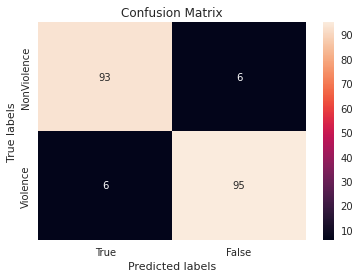

In [27]:
import seaborn as sns 
from sklearn.metrics import confusion_matrix

ax= plt.subplot()
cm=confusion_matrix(labels_test_normal, labels_predict)
sns.heatmap(cm, annot=True, fmt='g', ax=ax);  

ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['True', 'False']); ax.yaxis.set_ticklabels(['NonViolence', 'Violence']);

Classification Report

In [28]:
from sklearn.metrics import classification_report

ClassificationReport = classification_report(labels_test_normal,labels_predict)
print('Classification Report is : \n', ClassificationReport)

Classification Report is : 
               precision    recall  f1-score   support

           0       0.94      0.94      0.94        99
           1       0.94      0.94      0.94       101

    accuracy                           0.94       200
   macro avg       0.94      0.94      0.94       200
weighted avg       0.94      0.94      0.94       200



# **Prediction Frame By Frame**

In [32]:
def predict_frames(video_file_path, output_file_path, SEQUENCE_LENGTH):
    
    # Read from the video file.
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # VideoWriter to store the output video in the disk.
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('m', 'p', '4', 'v'), 
                                    video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))
 
    # Declare a queue to store video frames.
    frames_queue = deque(maxlen = SEQUENCE_LENGTH)
 
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Iterate until the video is accessed successfully.
    while video_reader.isOpened():
 
        ok, frame = video_reader.read() 
        
        if not ok:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame 
        normalized_frame = resized_frame / 255
 
        # Appending the pre-processed frame into the frames list.
        frames_queue.append(normalized_frame)
 
        # We Need at Least number of SEQUENCE_LENGTH Frames to perform a prediction.
        # Check if the number of frames in the queue are equal to the fixed sequence length.
        if len(frames_queue) == SEQUENCE_LENGTH:                        
 
            # Pass the normalized frames to the model and get the predicted probabilities.
            predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_queue, axis = 0))[0]
 
            # Get the index of class with highest probability.
            predicted_label = np.argmax(predicted_labels_probabilities)
 
            # Get the class name using the retrieved index.
            predicted_class_name = CLASSES_LIST[predicted_label]
 
        # Write predicted class name on top of the frame.
        if predicted_class_name == "Violence":
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 12)
        else:
            cv2.putText(frame, predicted_class_name, (5, 100), cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 255, 0), 12)
         
        # Write The frame into the disk using the VideoWriter
        video_writer.write(frame)                       
        
    video_reader.release()
    video_writer.release()

In [33]:
plt.style.use("default")

# To show Random Frames from the saved output predicted video (output predicted video doesn't show on the notebook but can be downloaded)
def show_pred_frames(pred_video_path): 

    plt.figure(figsize=(20,15))

    video_reader = cv2.VideoCapture(pred_video_path)

    # Get the number of frames in the video.
    frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Get Random Frames from the video then Sort it
    random_range = sorted(random.sample(range (SEQUENCE_LENGTH , frames_count ), 12))
        
    for counter, random_index in enumerate(random_range, 1):
        
        plt.subplot(5, 4, counter)

        # Set the current frame position of the video.  
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, random_index)
          
        ok, frame = video_reader.read() 

        if not ok:
          break 

        frame = cv2.cvtColor(frame , cv2.COLOR_BGR2RGB)

        plt.imshow(frame);ax.figure.set_size_inches(20,20);plt.tight_layout()
                            
    video_reader.release()

In [34]:
# Construct the output video path.
test_videos_directory = 'test_videos'
os.makedirs(test_videos_directory, exist_ok = True)
 
output_video_file_path = f'{test_videos_directory}/Output-Test-Video.mp4'

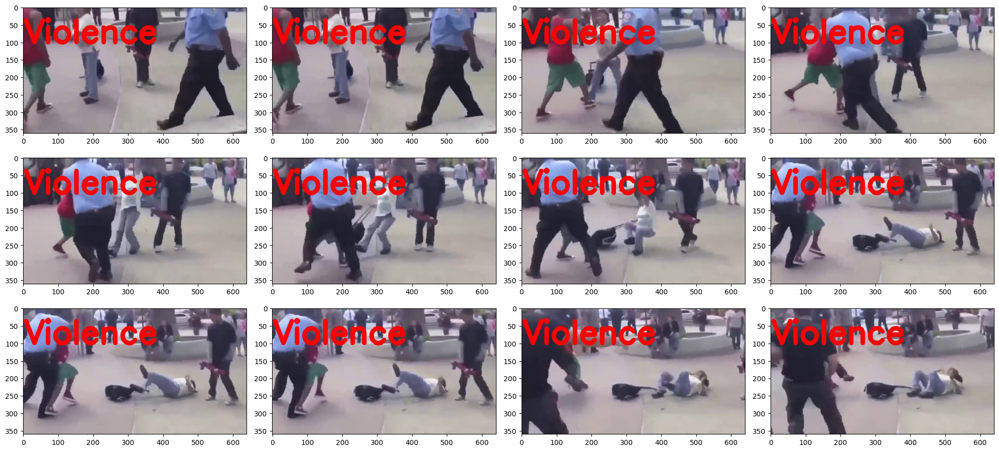

In [36]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_101.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [37]:
# Play the actual video
Play_Video(input_video_file_path)

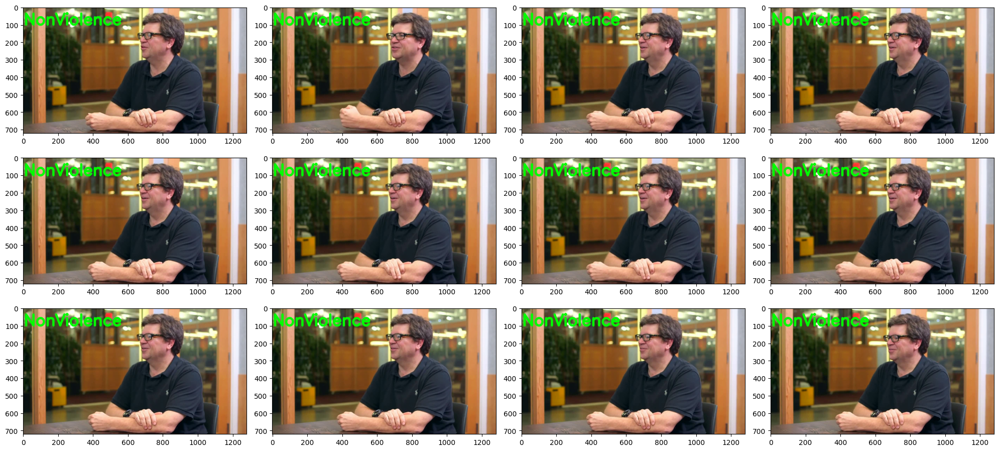

In [39]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1000.mp4"

# Perform Prediction on the Test Video.
predict_frames(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

# Show random frames from the output video
show_pred_frames(output_video_file_path)

In [40]:
# Play the actual video
Play_Video(input_video_file_path)

# **Prediction For The Video**

In [41]:
def predict_video(video_file_path, SEQUENCE_LENGTH):
 
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Get the width and height of the video.
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Declare a list to store video frames we will extract.
    frames_list = []
    
    # Store the predicted class in the video.
    predicted_class_name = ''
 
    # Get the number of frames in the video.
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
 
    # Calculate the interval after which frames will be added to the list.
    skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH),1)
 
    # Iterating the number of times equal to the fixed length of sequence.
    for frame_counter in range(SEQUENCE_LENGTH):
 
        # Set the current frame position of the video.
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)
 
        success, frame = video_reader.read() 
 
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions.
        resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))
        
        # Normalize the resized frame.
        normalized_frame = resized_frame / 255
        
        # Appending the pre-processed frame into the frames list
        frames_list.append(normalized_frame)
 
    # Passing the  pre-processed frames to the model and get the predicted probabilities.
    predicted_labels_probabilities = MoBiLSTM_model.predict(np.expand_dims(frames_list, axis = 0))[0]
 
    # Get the index of class with highest probability.
    predicted_label = np.argmax(predicted_labels_probabilities)
 
    # Get the class name using the retrieved index.
    predicted_class_name = CLASSES_LIST[predicted_label]
    
    # Display the predicted class along with the prediction confidence.
    print(f'Predicted: {predicted_class_name}\nConfidence: {predicted_labels_probabilities[predicted_label]}')
        
    video_reader.release()

In [42]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_276.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

Predicted: Violence
Confidence: 0.9999980926513672


In [53]:
# Specifying video to be predicted
input_video_file_path = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1.mp4"

# Perform Single Prediction on the Test Video.
predict_video(input_video_file_path, SEQUENCE_LENGTH)

# Play the actual video
Play_Video(input_video_file_path)

Predicted: NonViolence
Confidence: 0.9999815225601196


In [54]:
import numpy as np
import cv2 # Ensure cv2 is imported if not already in the cell

# Make sure these variables are defined and the model is loaded/trained before running this function:
# SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, CLASSES_LIST, MoBiLSTM_model
# Also, the frames_extraction function needs to be defined as you provided earlier.

def get_violence_percentage(video_file_path):
    """
    Predicts the violence percentage for a single video file.

    Args:
        video_file_path (str): The path to the video file.

    Returns:
        float: The predicted violence percentage (0-100),
               or None if the video cannot be processed or doesn't have enough frames.
    """
    print(f"Processing video: {video_file_path}")

    # --- Frame Extraction ---
    # Use the robust frames_extraction function you already have
    frames_list = frames_extraction(video_file_path)

    # Check if frame extraction was successful
    if not frames_list or len(frames_list) != SEQUENCE_LENGTH:
        print(f"Could not extract sufficient frames ({len(frames_list)}/{SEQUENCE_LENGTH}) from the video. Cannot predict.")
        return None # Indicate failure

    # --- Prediction ---
    try:
        # Add batch dimension for model prediction
        frames_for_prediction = np.expand_dims(frames_list, axis=0)

        # Get prediction probabilities from the model
        predicted_labels_probabilities = MoBiLSTM_model.predict(frames_for_prediction)[0] # Get the probabilities for the single video

        # Find the index for the 'Violence' class
        # Based on your CLASSES_LIST = ["NonViolence", "Violence"]
        violence_class_index = 1

        # Get the probability for the 'Violence' class
        violence_probability = predicted_labels_probabilities[violence_class_index]

        # Convert to percentage
        violence_percentage = violence_probability * 100

        print(f"Raw probabilities: {predicted_labels_probabilities}")
        print(f"Violence probability: {violence_probability:.4f}")

        return violence_percentage

    except Exception as e:
        print(f"An error occurred during prediction for {video_file_path}: {e}")
        return None

# --- Example Usage ---

# **Important**: Replace this with the actual path to the video you want to test
# This could be a path from your input dataset or a newly uploaded video file path
# For example, if you upload 'my_test_video.mp4' to the session storage:
# test_video_path = 'my_test_video.mp4'

# Or use one from your dataset:
test_video_path_violence = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_276.mp4"
test_video_path_nonviolence = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1.mp4"
test_video_path_mixed = "../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_101.mp4" # Example


print("\n--- Predicting Violence Video ---")
percentage_v = get_violence_percentage(test_video_path_violence)
if percentage_v is not None:
    print(f"The video '{os.path.basename(test_video_path_violence)}' contains violence with a confidence of: {percentage_v:.2f}%")
    Play_Video(test_video_path_violence) # Display the video

print("\n--- Predicting Non-Violence Video ---")
percentage_nv = get_violence_percentage(test_video_path_nonviolence)
if percentage_nv is not None:
    print(f"The video '{os.path.basename(test_video_path_nonviolence)}' contains violence with a confidence of: {percentage_nv:.2f}%")
    Play_Video(test_video_path_nonviolence) # Display the video

print("\n--- Predicting Another Video ---")
percentage_mixed = get_violence_percentage(test_video_path_mixed)
if percentage_mixed is not None:
    print(f"The video '{os.path.basename(test_video_path_mixed)}' contains violence with a confidence of: {percentage_mixed:.2f}%")
    Play_Video(test_video_path_mixed) # Display the video

# --- To use with any video file path you provide ---
# 1. Make sure the video file is accessible within your Kaggle environment
#    (either part of an input dataset or uploaded to the session storage)
# 2. Get the correct path to that video file.
# 3. Call the function:
#
# your_video_path = "/kaggle/working/uploaded_video.mp4" # Example path if uploaded
# violence_percent = get_violence_percentage(your_video_path)
# if violence_percent is not None:
#    print(f"\nYour video contains violence with a confidence of: {violence_percent:.2f}%")
#    Play_Video(your_video_path) # Display the video


--- Predicting Violence Video ---
Processing video: ../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_276.mp4
Raw probabilities: [1.8718893e-06 9.9999809e-01]
Violence probability: 1.0000
The video 'V_276.mp4' contains violence with a confidence of: 100.00%

--- Predicting Non-Violence Video ---
Processing video: ../input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1.mp4
Raw probabilities: [9.9998152e-01 1.8488025e-05]
Violence probability: 0.0000
The video 'NV_1.mp4' contains violence with a confidence of: 0.00%

--- Predicting Another Video ---
Processing video: ../input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_101.mp4
Raw probabilities: [9.448519e-06 9.999906e-01]
Violence probability: 1.0000
The video 'V_101.mp4' contains violence with a confidence of: 100.00%


**Github Repository :** [Real Time Violence Detection](https://github.com/abduulrahmankhalid/Real-Time-Violence-Detection)